In [6]:
from palette import Palette
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import concurrent.futures

In [7]:
notallowed = set()
with open('../posters_dataset/corrupt.txt','r') as f:
    a = f.readlines()
    for i in a:
        notallowed.add(i.strip())

allfiles = []
l = os.listdir('../posters_dataset/')
for i in l:
    if i.split(".")[-1] == 'jpg' and i not in notallowed:
        allfiles.append(i)

In [8]:
a=np.arange(len(allfiles))
np.random.shuffle(a)
a = a[:50]
newfiles = []
for i in a:
    newfiles.append(allfiles[i])

In [13]:
def save(i):
    cv2.imwrite('temp.jpg',i)
newfiles[0] = '214_horror.txt.jpg'    

def doit(i):
    tnm = '../posters_dataset/' + i
    origimg = cv2.imread(tnm)
    grayimg = cv2.cvtColor(cv2.cvtColor(origimg, cv2.COLOR_BGR2GRAY), cv2.COLOR_GRAY2BGR)
    
    save(origimg)
    RGBP = Palette('temp.jpg')
    RGBP.palette()
    z = RGBP.kmeans()
    origimg = cv2.cvtColor(origimg, cv2.COLOR_BGR2RGB)
    
    save(grayimg)
    GRAYP = Palette('temp.jpg')
    GRAYP.palette()
    y = GRAYP.kmeans()
    grayimg = cv2.cvtColor(grayimg, cv2.COLOR_BGR2RGB)
    
    newimg = GRAYP.colorTransform(y,z)
    d = np.concatenate((origimg, grayimg, newimg), axis=1)
    cv2.imwrite('./results/'+i, cv2.cvtColor(d, cv2.COLOR_RGB2BGR))

executor = concurrent.futures.ProcessPoolExecutor(40)
futures = [executor.submit(doit, item) for item in newfiles[20:30]]
print(len(futures))
concurrent.futures.wait(futures)
    
'''
for i in newfiles:
    tnm = '../posters_dataset/' + i
    origimg = cv2.imread(tnm)
    grayimg = cv2.cvtColor(cv2.cvtColor(origimg, cv2.COLOR_BGR2GRAY), cv2.COLOR_GRAY2BGR)
    
    save(origimg)
    RGBP = Palette('temp.jpg')
    RGBP.palette()
    z = RGBP.kmeans()
    origimg = cv2.cvtColor(origimg, cv2.COLOR_BGR2RGB)
    
    save(grayimg)
    GRAYP = Palette('temp.jpg')
    GRAYP.palette()
    y = GRAYP.kmeans()
    grayimg = cv2.cvtColor(grayimg, cv2.COLOR_BGR2RGB)
    
    newimg = GRAYP.colorTransform(y,z)
    d = np.concatenate((origimg, grayimg, newimg), axis=1)
    cv2.imwrite('./results/'+i, cv2.cvtColor(d, cv2.COLOR_RGB2BGR))
'''

10
0
0
0
0
100
100
100
100
200
200
200
300
200
400
300
300
(424, 300, 3)
300
400
400
(458, 300, 3)
(450, 300, 3)
400
(425, 300, 3)


"\nfor i in newfiles:\n    tnm = '../posters_dataset/' + i\n    origimg = cv2.imread(tnm)\n    grayimg = cv2.cvtColor(cv2.cvtColor(origimg, cv2.COLOR_BGR2GRAY), cv2.COLOR_GRAY2BGR)\n    \n    save(origimg)\n    RGBP = Palette('temp.jpg')\n    RGBP.palette()\n    z = RGBP.kmeans()\n    origimg = cv2.cvtColor(origimg, cv2.COLOR_BGR2RGB)\n    \n    save(grayimg)\n    GRAYP = Palette('temp.jpg')\n    GRAYP.palette()\n    y = GRAYP.kmeans()\n    grayimg = cv2.cvtColor(grayimg, cv2.COLOR_BGR2RGB)\n    \n    newimg = GRAYP.colorTransform(y,z)\n    d = np.concatenate((origimg, grayimg, newimg), axis=1)\n    cv2.imwrite('./results/'+i, cv2.cvtColor(d, cv2.COLOR_RGB2BGR))\n"

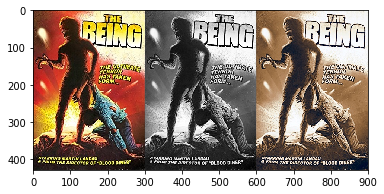

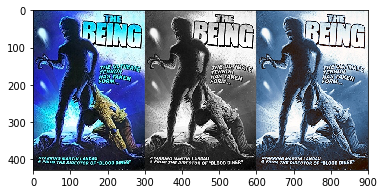

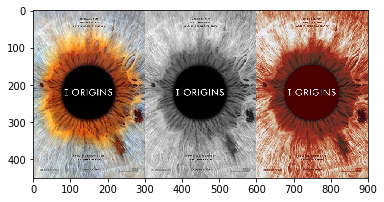

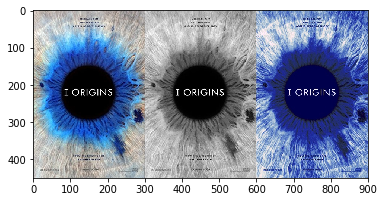

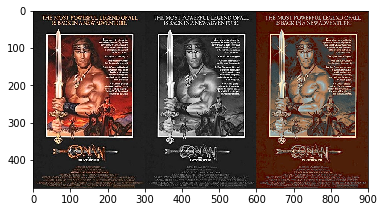

...

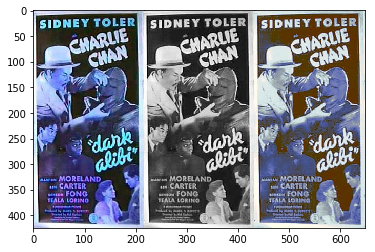

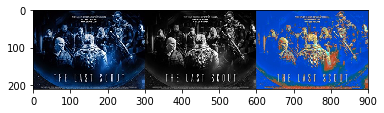

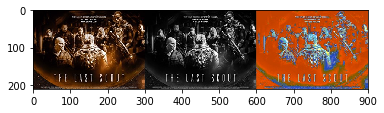

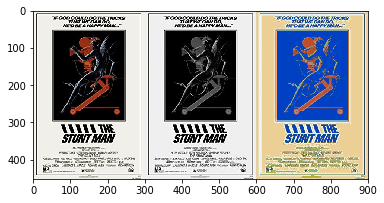

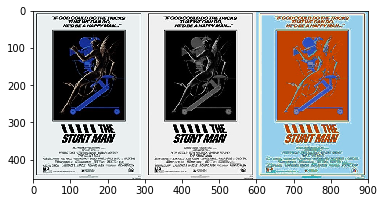

In [25]:
for i in newfiles:
    a = cv2.imread('./results/'+i)
    if a is None:
        continue
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    plt.imshow(a)
    plt.show()
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    plt.imshow(a)
    plt.show()